# Set-up

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from numpy import loadtxt
import os, glob
import geopandas as gpd
import geojsonio
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
import math
from IPython.display import Image
import psutil

# Plotly
import plotly
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import cufflinks as cf

import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from plotly.subplots import make_subplots
init_notebook_mode(connected=True)
cf.go_offline()
%matplotlib inline
#pd.options.plotting.backend = "plotly"

In [2]:
# Dashboard (Global Variables)
dataset_loc = "berlin"  # "berlin", "paris", "amsterdam"
dataset_date = "2020-03-17"  # "2019-12-11", "2020-01-10", "2020-02-18", "2020-03-17", "2020-05-14"
target = "price"
figcount = 0
figpath = f"figures_clean/{dataset_loc}_{dataset_date}/"

# Table Display Settings
pd.set_option('display.max_columns', 150)
pd.set_option('display.max_rows', 100)
pd.options.display.max_seq_items = 300
pd.set_option('display.max_colwidth', 150)

#Plotting Settings
sns.set(style="white")  #, palette=["#FF5A5F", "#00A699"])
sns.set_palette(sns.color_palette(["#767676", "#FF5A5F", "#00A699"]))

pio.templates.default = "simple_white"
px.defaults.template = "simple_white"  # 'ggplot2', 'seaborn', 'simple_white', 'plotly', 'plotly_white', 'plotly_dark', 'presentation', 'xgridoff', 'ygridoff', 'gridon', 'none'
px.defaults.color_continuous_scale = [
    "#B6B6B6", "#767676", "#FF9A7F", "#FF5A5F"
]  # ["#50D6B9", "#00A699", "#FF9A7F", "#FF5A5F"] #"burgyl"
px.defaults.color_discrete_sequence = ["#767676", "#FF5A5F", "#00A699"]
px.defaults.width = 900
px.defaults.height = 600

In [3]:
# Import data_clean
data = pd.read_pickle(f"saves/{dataset_loc}_{dataset_date}/data_clean.pkl")

In [4]:
# Create path to save figures (if not existing)
if not os.path.exists(figpath):
    os.mkdir(figpath)

In [5]:
# Delete all saved plots (caution!)
del_files = glob.glob(f'{figpath}*')
for f in del_files:
    os.remove(f)

In [6]:
# Function for saving plots with continuous number
def savefig(fig=None, title="Untitled", library="py"):
    global figcount
    global figpath
    existing = False
    filesave = ""
    save_files = glob.glob(f'{figpath}*')
    for f in save_files:
        if title in f:
            existing = True
            filesave = f
    if existing == True:
        if library == "py":
            fig.write_image(filesave)
        elif library == "plt":
            plt.savefig(filesave)
        else:
            print("Please enter valid library ('py', 'plt')")
    else:
        figcount += 1
        if library == "py":
            fig.write_image(f"{figpath}fig{figcount:02d}_{title}.png")
        elif library == "plt":
            plt.savefig(f"{figpath}fig{figcount:02d}_{title}.png")
        else:
            print("Please enter valid library ('py', 'plt')")
            figcount -= 1

# Data Exploration

In [7]:
# Display available columns from "data"
data.columns

Index(['accommodates', 'am_balcony', 'am_breakfast', 'am_child_friendly',
       'am_coffee_machine', 'am_cooking_basics', 'am_elevator',
       'am_essentials', 'am_nature_and_views', 'am_parking', 'am_pets_allowed',
       'am_private_entrance', 'am_smoking_allowed', 'am_tv', 'am_white_goods',
       'amenities', 'availability_365', 'availability_90', 'bathrooms',
       'bedrooms', 'beds', 'calculated_host_listings_count',
       'cancellation_policy', 'cleaning_fee', 'description', 'extra_people',
       'first_review', 'guests_included', 'host_acceptance_rate',
       'host_identity_verified', 'host_is_superhost', 'host_response_rate',
       'host_response_time', 'house_rules', 'instant_bookable', 'interaction',
       'is_location_exact', 'last_review', 'latitude', 'listing_url',
       'longitude', 'maximum_nights', 'minimum_nights', 'monthly_price',
       'name', 'neighborhood_overview', 'neighbourhood_cleansed', 'notes',
       'number_of_reviews', 'number_of_reviews_ltm', '

In [8]:
# Define "reduced_features"
reduced_features = [
    "accommodates",
    "availability_365",
    #                   "availability_90",
    #                   "bathrooms",
    #                   "bedrooms",
    #                   "beds",
    "calculated_host_listings_count",
    "extra_people",
    #                   "guests_included",
    #                   "maximum_nights",
    "minimum_nights",
    "price",
    "review_scores_rating"
]

In [9]:
# Define "key_features"
key_features = [
    "accommodates",
    #                   "availability_365",
    #                   "availability_90",
    #                   "bathrooms",
    #                   "bedrooms",
    #                   "beds",
    "calculated_host_listings_count",
    #                   "extra_people",
    #                   "guests_included",
    #                   "maximum_nights",
    #                   "minimum_nights",
    "price",
    "review_scores_rating",
    "host_is_superhost"
]

In [10]:
# Separate/create variables for numerical and categorical features
num_features = list(data.columns[data.dtypes != object])
cat_features = list(data.columns[data.dtypes == object])
#data_cont = data[num_features]

## Interactive Dashboards

In [11]:
# Display figures from graphical exploration below direcly here in the dashboard
@interact_manual
def show_images(file=sorted(os.listdir(figpath))):
    display(Image(figpath + file))

interactive(children=(Dropdown(description='file', options=(), value=None), Button(description='Run Interact',…

In [12]:
# Display table with all rows where feature value is > x (where x is the selected threshold)
@interact(x=widgets.IntSlider(1, 0, 100, 1, continuous_update=False))
def filter_data(column=num_features, x=10):
    return data.loc[data[column] > x]

interactive(children=(Dropdown(description='column', options=('accommodates', 'am_balcony', 'am_breakfast', 'a…

In [13]:
# Display interactive plot for comparing two features
@interact_manual(
    x=widgets.Dropdown(options=list(data.select_dtypes('number').columns),
                       index=0,
                       description="Feature"),
    y=widgets.Dropdown(options=list(data.select_dtypes('number').columns),
                       value=target,
                       description="Target"),
    kind=widgets.Dropdown(
        options=["bar", "box", "bubble", "heatmap", "histogram", "scatter"],
        value="bar",
        description="Plot Type"))
#                 text='title',
#                 theme=widgets.Dropdown(options=list(cf.themes.THEMES.keys()),description="Theme"),
#                 colorscale=widgets.Dropdown(options=list(cf.colors._scales_names.keys()),description="Colorscale"))
def scatter_plot(x, y, kind):  #,theme,colorscale):

    data.iplot(kind=kind,
               x=x,
               y=y,
               mode='markers',
               xTitle=str(x),
               yTitle=str(y),
               title=f'{str(y)} vs {str(x)}')


#        text=title,
#        theme=theme,
#        colorscale=colorscale)

interactive(children=(Dropdown(description='Feature', options=('accommodates', 'am_balcony', 'am_breakfast', '…

## Tables (non-graphical exploration)

In [14]:
# Get extensive ProfileReport
#profile = ProfileReport(data, title='Pandas Profiling Report', explorative=True)
#profile.to_widgets()
#profile.to_notebook_iframe()

In [15]:
# Examine shape and head/columns of data
print(data.shape)
data.head(1)

(10471, 66)


,accommodates,am_balcony,am_breakfast,am_child_friendly,am_coffee_machine,am_cooking_basics,am_elevator,am_essentials,am_nature_and_views,am_parking,am_pets_allowed,am_private_entrance,am_smoking_allowed,am_tv,am_white_goods,amenities,availability_365,availability_90,bathrooms,bedrooms,beds,calculated_host_listings_count,cancellation_policy,cleaning_fee,description,extra_people,first_review,guests_included,host_acceptance_rate,host_identity_verified,host_is_superhost,host_response_rate,host_response_time,house_rules,instant_bookable,interaction,is_location_exact,last_review,latitude,listing_url,longitude,maximum_nights,minimum_nights,monthly_price,name,neighborhood_overview,neighbourhood_cleansed,notes,number_of_reviews,number_of_reviews_ltm,price,property_type,review_scores_accuracy,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_rating,review_scores_value,room_type,security_deposit,space,summary,transit,weekly_price,zipcode
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
3176,4,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,"{Internet,Wifi,Kitchen,""Buzzer/wireless intercom"",Heating,""Family/kid friendly"",Washer,""Smoke detector"",""Carbon monoxide detector"",""First aid kit""...",140,0,1.0,1.0,2.0,1,strict_14_with_grace_period,100.0,This beautiful first floor apartment is situated at Kollwitzplatz. Its ideal for 2 but can comfortably accommodate 4 with the extra double bed i...,20.0,2009-06-20,2,80.0,t,f,100.0,within a few hours,"It’s a non smoking flat, which likes to be treated with love and respect ;) we don't tolerate parties or pets. Family and kids are more than welco...",f,Feel free to ask any questions prior to booking and during your stay. Once you have booked you will receive via airbnb all relevant information ab...,t,2019-06-27,52.535,https://www.airbnb.com/rooms/3176,13.41758,1125,62,1900.0,Fabulous Flat in great Location,"The neighbourhood is famous for its variety of international eateries, pubs, restaurants, cafés, galleries and little shops. The bakery next door ...",Prenzlauer Berg Südwest,"We welcome FAMILIES and cater especially for young kids. You can make use from our highchair, baby cot and baby bouncer. We also have some trusted...",145,1,90.0,Apartment,9.0,9.0,9.0,9.0,10.0,93.0,9.0,Entire home/apt,300.0,1st floor (68m2) apartment on Kollwitzplatz/ Prenzlauer Berg. It's ideal for 2 but can sleep comfortably an extra 2 in the living room. (Please le...,This beautiful first floor apartment is situated at Kollwitzplatz. Its ideal for 2 but can comfortably accommodate 4 with the extra double bed i...,"We are 5 min walk away from the tram M2, which will take you to Alexander Platz- here you can connect to buses, trains and trams that take you an...",520.0,zip_10405


**Outliers**

In [16]:
# Examine illogical column values (e.g. "accommodates" < "guests_included", "bedrooms" > "beds", ...)
data[data.accommodates - data.beds < 0]

,accommodates,am_balcony,am_breakfast,am_child_friendly,am_coffee_machine,am_cooking_basics,am_elevator,am_essentials,am_nature_and_views,am_parking,am_pets_allowed,am_private_entrance,am_smoking_allowed,am_tv,am_white_goods,amenities,availability_365,availability_90,bathrooms,bedrooms,beds,calculated_host_listings_count,cancellation_policy,cleaning_fee,description,extra_people,first_review,guests_included,host_acceptance_rate,host_identity_verified,host_is_superhost,host_response_rate,host_response_time,house_rules,instant_bookable,interaction,is_location_exact,last_review,latitude,listing_url,longitude,maximum_nights,minimum_nights,monthly_price,name,neighborhood_overview,neighbourhood_cleansed,notes,number_of_reviews,number_of_reviews_ltm,price,property_type,review_scores_accuracy,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_rating,review_scores_value,room_type,security_deposit,space,summary,transit,weekly_price,zipcode
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


**Skew**

In [17]:
# Look at data skew (to check whether scaling with e.g. log makes sense for highly skewed features)
data.skew()

accommodates                      1.545736
am_balcony                        1.025492
am_breakfast                      4.169982
am_child_friendly                 0.880605
am_coffee_machine                 0.014328
am_cooking_basics                -0.348852
am_elevator                       1.180819
am_essentials                    -4.656841
am_nature_and_views               4.832727
am_parking                       -0.440305
am_pets_allowed                   1.720026
am_private_entrance               1.329132
am_smoking_allowed                2.095970
am_tv                            -0.093900
am_white_goods                   -1.695705
availability_365                  0.729146
availability_90                   0.235041
bathrooms                         6.229172
bedrooms                          2.193631
beds                              2.366017
calculated_host_listings_count    5.273181
cleaning_fee                      2.010408
extra_people                      2.532148
guests_incl

Features with high skew are engineered in 3_Feature_Engineering and converted into log and/or sqrt.

**Correlation**

In [18]:
# Interactive feature vs. feature correlation check
@interact
def correlations(column1=list(data.select_dtypes('number').columns),
                 column2=list(data.select_dtypes('number').columns)):
    print(f"Correlation: {data[column1].corr(data[column2])}")

interactive(children=(Dropdown(description='column1', options=('accommodates', 'am_balcony', 'am_breakfast', '…

In [19]:
# Full list of correlation values
data.corr()

,accommodates,am_balcony,am_breakfast,am_child_friendly,am_coffee_machine,am_cooking_basics,am_elevator,am_essentials,am_nature_and_views,am_parking,am_pets_allowed,am_private_entrance,am_smoking_allowed,am_tv,am_white_goods,availability_365,availability_90,bathrooms,bedrooms,beds,calculated_host_listings_count,cleaning_fee,extra_people,guests_included,host_acceptance_rate,host_response_rate,latitude,longitude,maximum_nights,minimum_nights,monthly_price,number_of_reviews,number_of_reviews_ltm,price,review_scores_accuracy,review_scores_checkin,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_rating,review_scores_value,security_deposit,weekly_price
accommodates,1.000000,0.069042,-0.020965,0.315729,0.152898,0.109070,0.058105,-0.042116,0.001919,0.097585,0.080843,0.157823,-0.103325,0.269560,0.038770,0.173707,0.101960,0.221210,0.667396,0.802139,0.229260,0.409958,0.275596,0.598887,0.095690,0.064821,0.035346,0.009938,0.120540,-0.055460,0.061805,0.110798,0.112690,0.575306,-0.073063,-0.049179,-0.030990,-0.066382,-0.065601,-0.097520,-0.118731,0.083800,0.058602
am_balcony,0.069042,1.000000,-0.012928,0.098996,0.295225,0.404795,0.156104,0.072392,0.103029,0.224389,0.009404,0.037786,0.014486,0.105183,0.145199,-0.049561,-0.035778,0.080052,0.097642,0.028594,-0.090860,0.115497,0.075092,0.080455,0.040584,0.062470,0.012917,0.006403,-0.022095,-0.003821,0.032435,-0.009894,-0.006926,0.133376,0.079751,0.053969,0.094970,0.074584,0.051429,0.109900,0.083755,0.078753,0.046232
am_breakfast,-0.020965,-0.012928,1.000000,-0.027743,-0.036793,-0.058045,0.005540,0.031114,0.003291,-0.022480,0.036563,0.000010,0.035543,-0.027919,-0.003486,-0.014010,0.008307,-0.011631,-0.017539,-0.029029,-0.049364,-0.051448,-0.005125,-0.046633,-0.027940,-0.006958,-0.005595,-0.013938,-0.010208,-0.038294,-0.034702,-0.064187,-0.069917,0.019790,0.001730,-0.003011,-0.002499,0.005455,0.011148,0.021761,0.012862,-0.011706,-0.041544
am_child_friendly,0.315729,0.098996,-0.027743,1.000000,0.134484,0.115440,0.032746,-0.011761,0.013295,0.193173,0.067743,0.017548,-0.082392,0.169106,0.034635,0.173570,0.056553,0.078489,0.261728,0.276419,0.057656,0.213921,0.175513,0.249879,0.005599,0.030789,0.005545,0.016722,0.023672,0.028642,0.184569,0.279191,0.124115,0.220321,-0.002073,0.005508,0.033961,-0.000461,-0.012941,-0.036704,-0.040236,0.064278,0.195188
am_coffee_machine,0.152898,0.295225,-0.036793,0.134484,1.000000,0.550447,0.021834,0.099677,0.070348,0.305608,0.010845,0.092362,-0.038630,0.177501,0.132903,0.078657,0.067258,0.042548,0.106274,0.113710,0.039159,0.174108,0.104774,0.161513,0.157556,0.124108,0.023047,-0.012959,-0.003418,-0.012282,0.060194,0.166499,0.178873,0.124405,0.086561,0.065340,0.122728,0.074293,0.052694,0.079583,0.062104,0.067755,0.060614
am_cooking_basics,0.109070,0.404795,-0.058045,0.115440,0.550447,1.000000,0.010755,0.132650,0.088021,0.348245,0.021727,0.055476,-0.018192,0.073238,0.213980,-0.010830,-0.001568,0.022748,0.072842,0.069830,-0.120388,0.137582,0.120867,0.120812,0.113567,0.114577,0.012660,0.016233,-0.002198,-0.025380,0.046492,0.108266,0.127314,0.096174,0.070722,0.046345,0.089024,0.068655,0.054487,0.069661,0.060397,0.063432,0.052713
am_elevator,0.058105,0.156104,0.005540,0.032746,0.021834,0.010755,1.000000,-0.014079,0.036147,0.013321,-0.020411,-0.000390,-0.017316,0.149060,0.060348,0.043432,0.050308,0.103245,0.029538,0.014515,0.104170,0.082542,0.030284,0.035914,0.016570,0.025545,0.046195,-0.042885,0.033507,0.042200,0.034028,-0.000292,0.016609,0.201987,-0.014983,-0.014669,0.009787,-0.019921,0.043647,-0.010690,-0.030671,0.075478,0.039051
am_essentials,-0.042116,0.072392,0.031114,-0.011761,0.099677,0.132650,-0.014079,1.000000,0.020637,0.105236,0.017810,0.056822,0.016504,-0.017961,0.046838,-0.056652,-0.012638,-0.008467,0.000274,-0.021795,-0.204639,0.005377,-0.034867,-0.003854,0.061148,0.025034,-0.006032,0.009256,0.011880,-0.032112,-0.050704,0.030133,0.056959,0.010105,0.072532,0.061332,0.066332,0.063315,0.060193,0.073843,0.062601,0.017833,-0.050

## Plot visualizations (graphical exploration)

In [20]:
# Histogram of price
fig = px.histogram(
    data,
    x="price",
    title="Price Histogram",
    #             color="host_is_superhost",
    marginal="rug",  # 'rug', 'box', 'violin', 'histogram'
    nbins=50)

fig.show()
savefig(fig, title="histogram_price")

Price is strongly skewed to the right and will be replaced with its log.

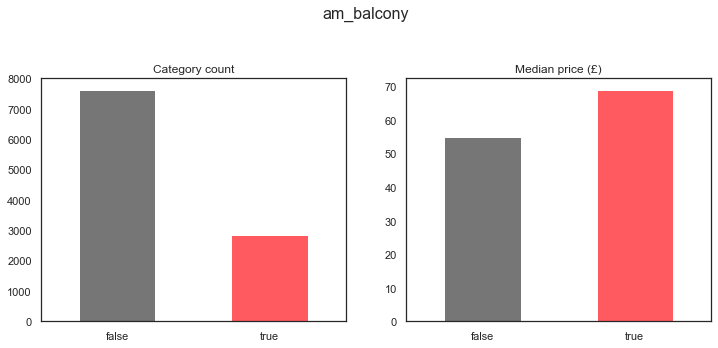

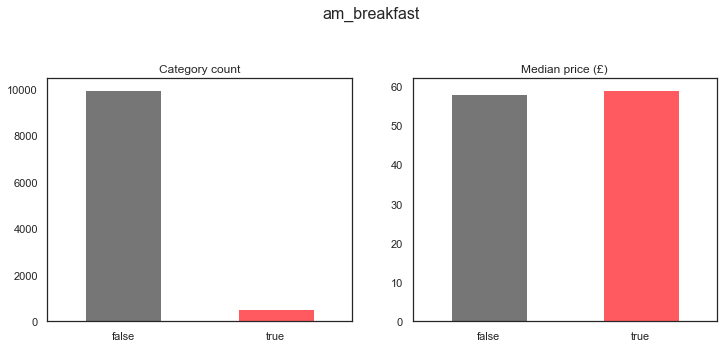

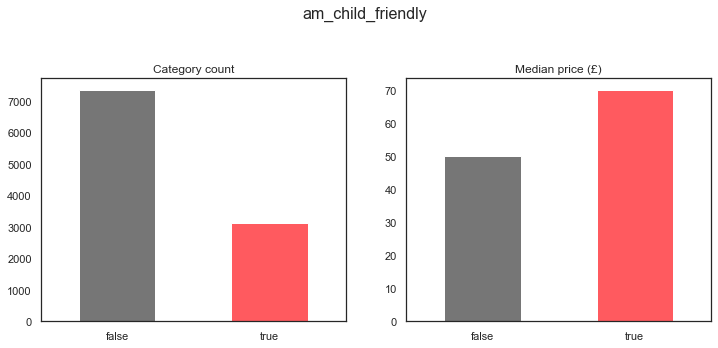

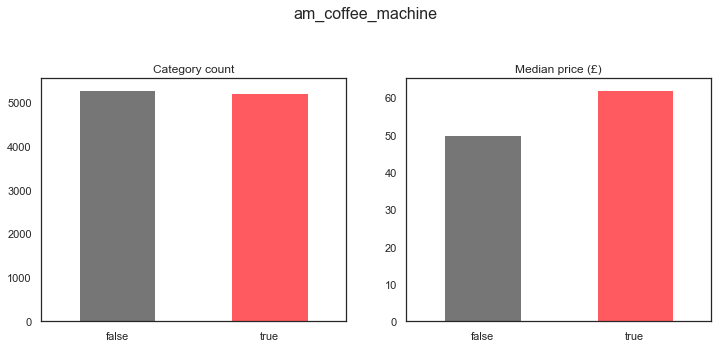

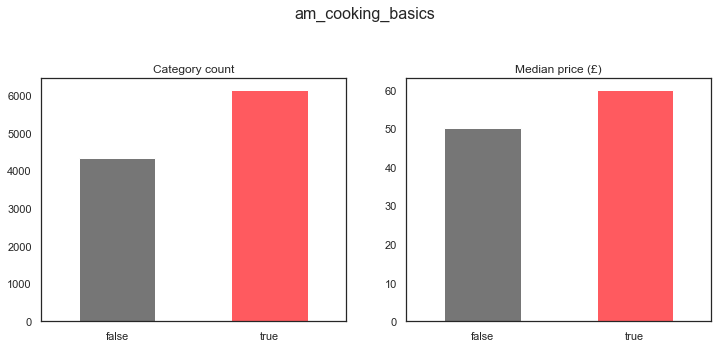

...

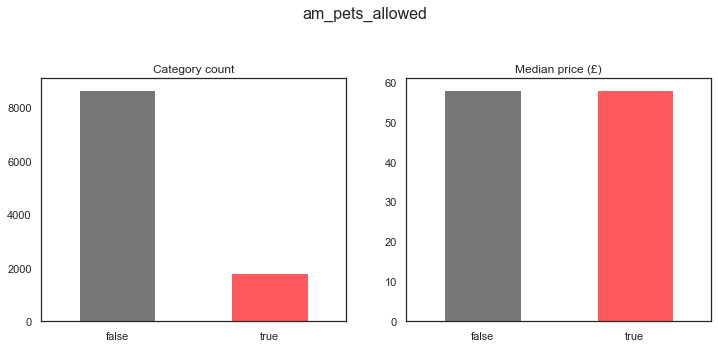

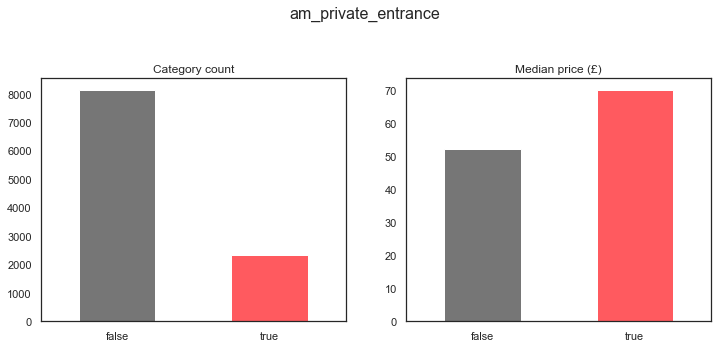

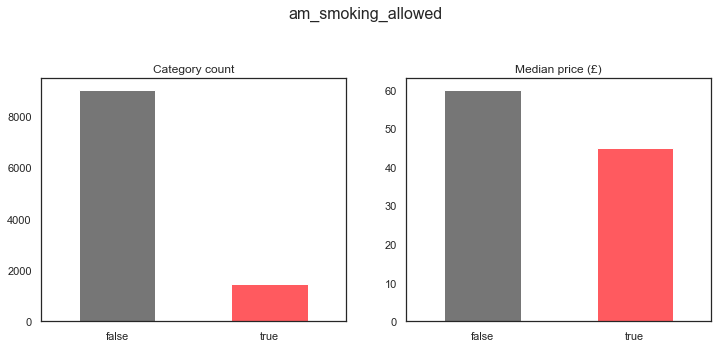

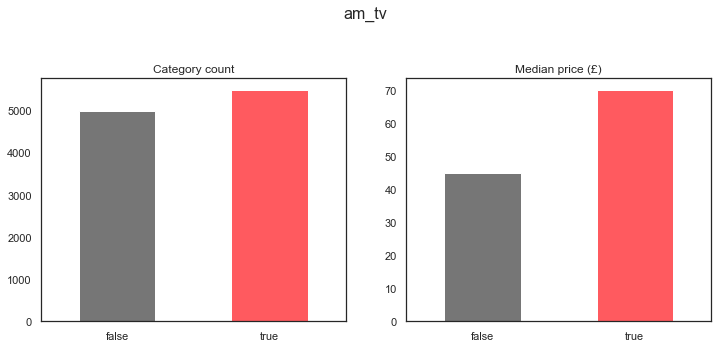

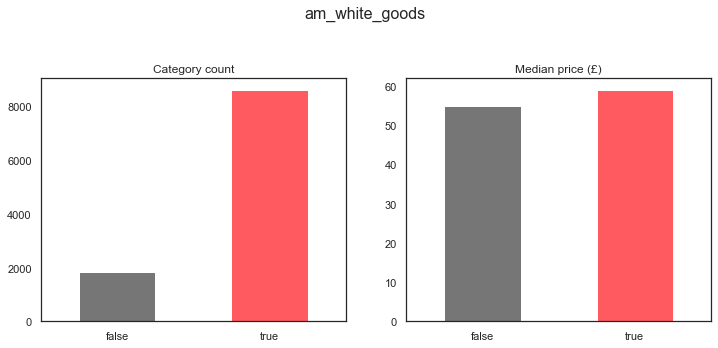

In [21]:
# Count and median price for amenities
am_col = [el for el in data.columns if el.startswith("am_")]

for col in am_col:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    fig.suptitle(col, fontsize=16, y=1)
    plt.subplots_adjust(
        top=0.80
    )  # So that the suptitle does not overlap with the ax plot titles

    data.groupby(col).size().plot(kind='bar',
                                  ax=ax1,
                                  color=["#767676", "#FF5A5F"])
    ax1.set_xticklabels(labels=['false', 'true'], rotation=0)
    ax1.set_title('Category count')
    ax1.set_xlabel('')

    data.groupby(col).price.median().plot(kind='bar',
                                          ax=ax2,
                                          color=["#767676", "#FF5A5F"])
    ax2.set_xticklabels(labels=['false', 'true'], rotation=0)
    ax2.set_title('Median price (£)')
    ax2.set_xlabel('')

    plt.show()

Most amenities show a strong positive relationship with median price. The only major exception is - unsurprisingly - am_smoking_allowed. Some others are less meaningful due to very inbalanced classes.

C:\Users\Mauricio\anaconda3\envs\airbnb42\lib\site-packages\pandas\plotting\_tools.py:307: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

C:\Users\Mauricio\anaconda3\envs\airbnb42\lib\site-packages\pandas\plotting\_tools.py:307: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().colspan.start instead.

C:\Users\Mauricio\anaconda3\envs\airbnb42\lib\site-packages\pandas\plotting\_tools.py:313: MatplotlibDeprecationWarning:


The rowNum attribute was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use ax.get_subplotspec().rowspan.start instead.

C:\Users\Mauricio\anaconda3\envs\airbnb42\lib\site-packages\pandas\plotting\_tools.py:313: MatplotlibDeprecationWarning:


The colNum attribute was deprecated in Matplotlib 3.2 and wil

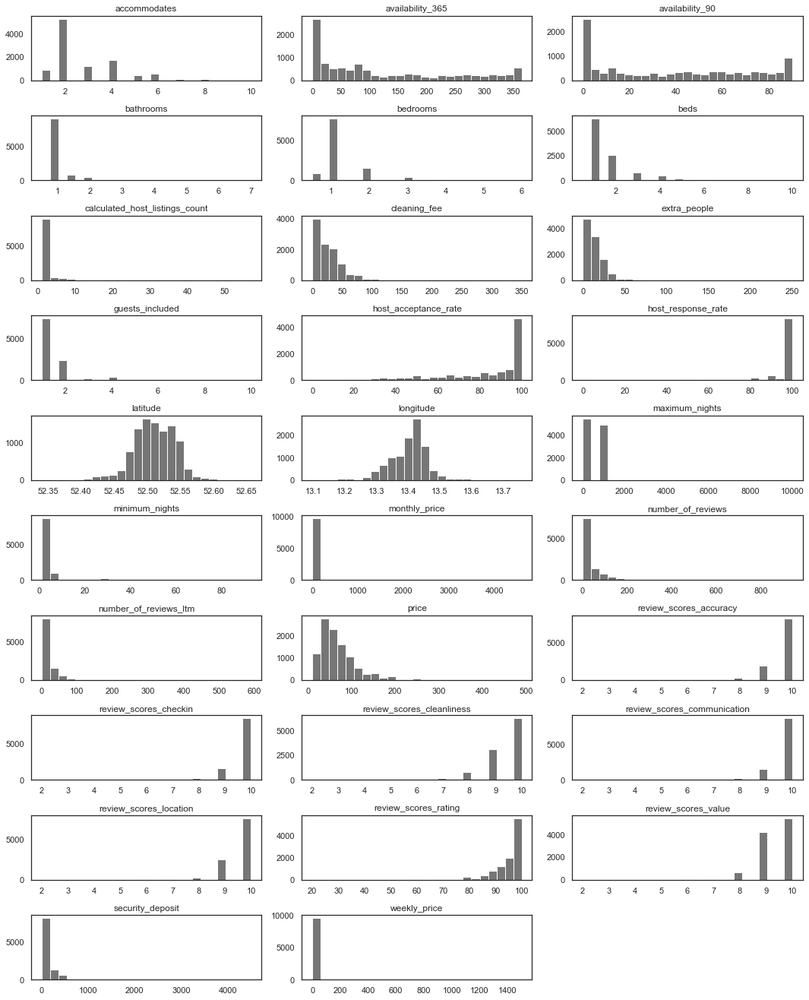

In [22]:
# Histogram of numerical features except amenities
hist_col = [el for el in num_features if el not in am_col]
data[hist_col].hist(figsize=(15, 20),
                    bins=25,
                    layout=(int(len(hist_col) / 3) + 1, 3),
                    grid=False)
plt.tight_layout()
savefig(title="histogram_num_features", library="plt")

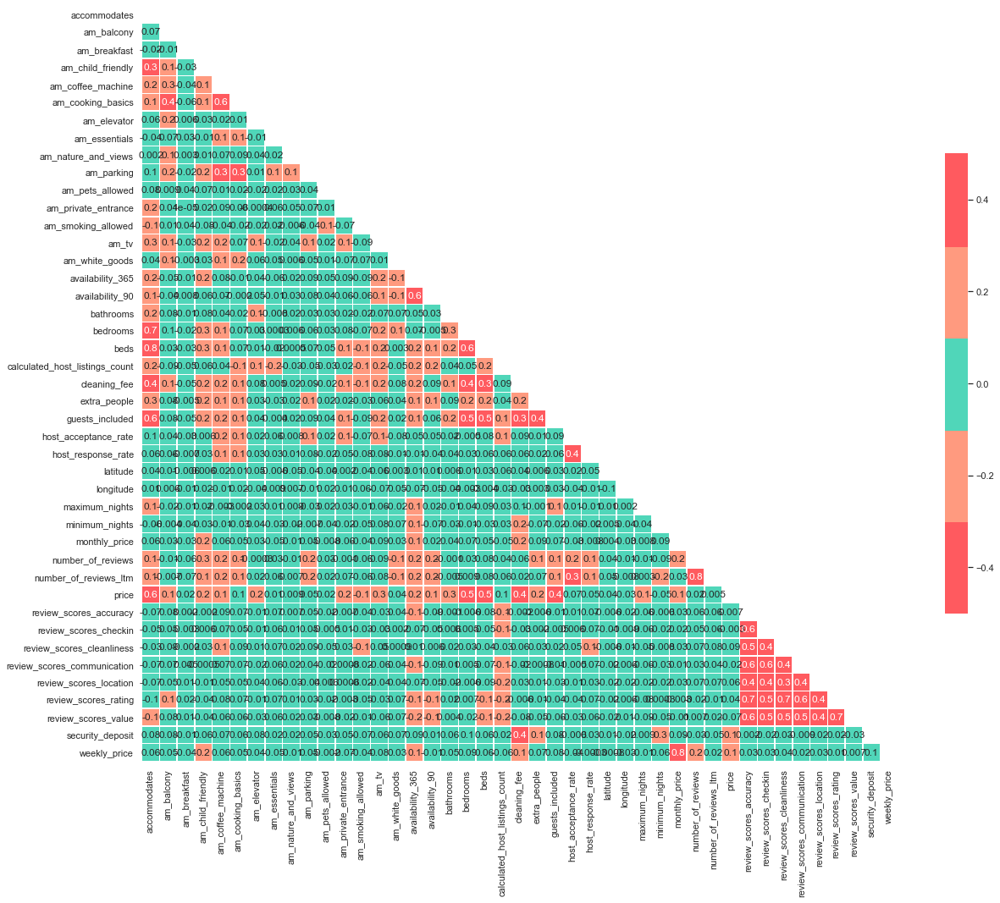

In [23]:
# Correlation heatmap for numerical features (Version 1)
#Generate a mask for the upper triangle
mask = np.triu(np.ones_like(data[num_features].corr(), dtype=np.bool))

#Set up the matplotlib figure
f, ax = plt.subplots(figsize=(20, 20))

#Generate a custom diverging colormap
#cmap = sns.diverging_palette(220, 10, as_cmap=True)
#cmap = [(0, 166, 153), (255, 90, 95)]

#Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(data[num_features].corr(),
            mask=mask,
            cmap=["#FF5A5F", "#FF9A7F", "#50D6B9", "#FF9A7F", "#FF5A5F"],
            vmax=.5,
            vmin=-.5,
            center=0,
            square=True,
            linewidths=.5,
            cbar_kws={"shrink": .5},
            annot=True,
            fmt=".1g")

savefig(title="full_heatmap", library="plt")

Highly correlated features will be removed from the analysis. For this purpose, the threshold is roughly set at two correlations of 0.4 or above. Hence, the following features are removed:

| **FEATURE** | **REASONING** |
| :----- | :----- |
| **am_cooking_basics** | Particularly high correlation with **am_coffee_machine** and **am_balcony** |
| **bedroom** and **beds** | High correlation with each other, with **accommodates** and similar correlation with other features: Combine accommodates and beds to new feature |
| **security_deposit** and **space** | Similar correlation to **cleaning_fee** or **extra_people**: Potentially make a numerical feature counting amount of "special" features instead (0-4) |
| **** |  |



In [24]:
# Correlation heatmap for numerical features (Version 2)
corr = data[num_features].corr().copy()
N = len(num_features)
#hovertext = [[f'corr({num_features[i]}, {num_features[j]})= {corr[i][j]:.2f}' if i>j else '' for j in range(N)] for i in range(N)]

heatmp = go.Heatmap(z=corr,
                    x=num_features,
                    y=num_features,
                    xgap=1,
                    ygap=1,
                    text=corr,
                    colorbar_thickness=20,
                    colorbar_ticklen=3,
                    colorscale=[[0, 'rgb(255, 255, 255)'],
                                [0.5, 'rgb(255, 90, 95)'],
                                [1.0, 'rgb(0, 0, 0)']])

#data = [trace]
layout = go.Layout(title_text="Correlation Heatmap Numerical Features",
                   title_x=0.5,
                   xaxis_showgrid=False,
                   yaxis_showgrid=False,
                   yaxis_autorange='reversed',
                   width=900,
                   height=900)
fig = go.Figure(data=heatmp, layout=layout)

fig.show()
#savefig(fig, title="scatter_price_vs_accommodates")

In [25]:
# Scatterplot y=price x=accommodates
fig = px.scatter(data,
                 x='accommodates',
                 y='price',
                 title='Price vs. Accommodates',
                 color='host_is_superhost',
                 marginal_y='violin',
                 marginal_x='box',
                 trendline='ols',
                 opacity=0.3)
fig.show()
savefig(fig, title="scatter_price_vs_accommodates")

Superhosts achieve a higher price on average, even though this relationship does not appear to be particularly strong.

In [26]:
# Histogram/facet grid instant_bookable vs. room_type
fig = px.histogram(
    data,
    x='instant_bookable',
    title='Bookable vs. Room Type',
    color='host_is_superhost',
    barmode='relative',  # 'group', 'overlay', 'relative'
    facet_row='host_identity_verified',
    facet_col='room_type',
)
fig.show()
savefig(fig, title="facet_bookable_vs_room_type")

No particularly strong distinction is observable when looking at instant bookability compared to host_is_superhost and room_type.

In [27]:
# Scatter Matrix of select features
fig = px.scatter_matrix(data,
                        dimensions=key_features,
                        color='room_type',
                        opacity=0.5,
                        width=1000,
                        title="Scatter Matrix",
                        height=1000)
fig.show()
savefig(fig, title="matrix_key_features")

In [28]:
# Plot histogram of review_scores_rating
fig = px.histogram(data,
                   x="review_scores_rating",
                   color="host_is_superhost",
                   marginal="rug",
                   title="Review Scores Histogram",
                   nbins=50)

fig.show()
savefig(fig, title="histogram_review_scores")

Clearly and unsurprisingly superhosts achieve higher ratings - less though for 100% ratings, which may be listings with fewer reviews and perfect ratings.

In [29]:
# Violinplot price vs. property_type
fig = px.violin(data,
                y="price",
                x="property_type",
                color="host_is_superhost",
                box=True,
                title="Price vs. Property Type",
                points="all")
fig.show()
savefig(fig, title="violin_price_vs_property_type")

Price varies substantially among different property_types.

In [30]:
# Stripplot price vs room_type
fig = px.strip(data,
               x="price",
               y="room_type",
               orientation="h",
               title="Price vs. Room Type",
               color="host_is_superhost")
fig.show()
savefig(fig, title="strip_price_vs_roomtype")

Even more so, price appears to be heavily driven by room_type.

## Map visualizations (graphical exploration)

In [31]:
# Prepare geojson and data_geo

# Load up the file
geojson = gpd.read_file(f'data/{dataset_loc}_{dataset_date}/neighbourhoods.geojson')

# Creating a dataframe of listing counts and median price by borough
data_geo = pd.DataFrame(data.groupby('neighbourhood_cleansed').size())
data_geo.rename(columns={0: 'number_of_listings'}, inplace=True)
data_geo['median_price'] = data.groupby(
    'neighbourhood_cleansed').price.median().values

# Joining the dataframes
#data_geo_map = geojson.set_index('neighbourhood').join(data_geo)
data_geo["neighbourhood"] = data_geo.index

In [32]:
# Berlin map with all listings
fig = px.scatter_mapbox(
    data,
    title="Berlin | All Listings",
    lat="latitude",
    lon="longitude",
    color="price",
    size="accommodates",
    size_max=15,
    hover_name="room_type",
    hover_data={
        "latitude": False,
        "longitude": False,
        "bedrooms": True,
        "price": True,
        "neighbourhood_cleansed": False
    },
    #    range_color=[10,200],
    zoom=10,
    opacity=0.8,
    mapbox_style="carto-positron")

fig.show()
savefig(fig, title="Berlin_map_all_listings")

In [33]:
# Berlin map with listings per "neighbourhood_cleansed"
fig = px.choropleth_mapbox(data_geo,
                           title="Berlin | Listings per Neighbourhood",
                           geojson=geojson,
                           color="number_of_listings",
                           locations="neighbourhood",
                           featureidkey="properties.neighbourhood",
                           center={
                               "lat": 52.5200,
                               "lon": 13.4050
                           },
                           hover_name="neighbourhood",
                           hover_data={
                               "number_of_listings": True,
                               "median_price": True,
                               "median_price": ":.2f",
                               "neighbourhood": False
                           },
                           mapbox_style="carto-positron",
                           zoom=9,
                           opacity=0.5)
fig.show()
savefig(fig, title="Berlin_map_listings_per_neighbh")

Most listings can be found in the centre and east side of Berlin.

In [34]:
# Berlin map with prices per "neighbourhood_cleansed"
fig = px.choropleth_mapbox(data_geo,
                           title="Berlin | Avg Prices per Neighbourhood",
                           geojson=geojson,
                           color="median_price",
                           locations="neighbourhood",
                           featureidkey="properties.neighbourhood",
                           center={
                               "lat": 52.5200,
                               "lon": 13.4050
                           },
                           hover_name="neighbourhood",
                           hover_data={
                               "number_of_listings": True,
                               "median_price": ":.2f",
                               "neighbourhood": False
                           },
                           mapbox_style="carto-positron",
                           zoom=9,
                           opacity=0.5)
fig.show()
savefig(fig, title="Berlin_map_price_per_neighbh")

Prices, however, do not directly coincide with number of listings, as many areas to the west and also some outside areas appear to have higher prices than some eastern areas.